In [1]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
%config InlineBackend.figure_format = 'svg'
plt.rcParams["figure.figsize"] = (8, 5)
plt.rcParams["image.cmap"] = "viridis"

import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Probit
from sklearn.linear_model import LogisticRegression

In [2]:
df_2013_2014 = pd.read_csv('../data_preprocessed/data_2013_2014.csv')
df_2014_2015 = pd.read_csv('../data_preprocessed/data_2014_2015.csv')
df_2015_2016 = pd.read_csv('../data_preprocessed/data_2015_2016.csv')
df_2016_2017 = pd.read_csv('../data_preprocessed/data_2016_2017.csv')
df_2017_2018 = pd.read_csv('../data_preprocessed/data_2017_2018.csv')

In [3]:
data = pd.concat([df_2013_2014,df_2014_2015,df_2015_2016,
                 df_2016_2017,df_2017_2018]).astype({'neigh_airports_pr_period':'int32'})

In [11]:
print(data[['served_airports_pr_period', 'neigh_airports_pr_period',
      'airport_type', 'population', 'megapolis', 'tourist','distance_km']].describe(percentiles = [0.5]).T.round(2).to_latex())

\begin{tabular}{lrrrrrr}
\toprule
{} &    count &     mean &      std &     min &      50\% &      max \\
\midrule
served\_airports\_pr\_period &  51894.0 &     4.68 &     6.28 &    0.00 &     2.00 &    26.00 \\
neigh\_airports\_pr\_period  &  51894.0 &     0.53 &     1.70 &    0.00 &     0.00 &    26.00 \\
airport\_type              &  51894.0 &     0.59 &     0.63 &    0.00 &     1.00 &     2.00 \\
population                &  51894.0 &  1234.23 &  1186.18 &   75.50 &   838.92 &  8181.20 \\
megapolis                 &  51894.0 &     1.06 &     0.69 &    0.00 &     1.00 &     2.00 \\
tourist                   &  51894.0 &     0.38 &     0.54 &    0.00 &     0.00 &     2.00 \\
distance\_km               &  51894.0 &  2774.33 &  2008.95 &  135.75 &  2087.11 &  7492.86 \\
\bottomrule
\end{tabular}



In [18]:
regressors = ['served_airports_pr_period', 'neigh_airports_pr_period',
              'airport_type', 'population', 'megapolis', 'tourist',
              'distance_km']
X = data[regressors]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

tsne = TSNE(random_state=17)
tsne_repr = tsne.fit_transform(X_scaled)

In [5]:
crosstab_1 = pd.crosstab(data['entry_2'], data['megapolis'], normalize = 'index').round(2)

crosstab_2 = pd.crosstab(data['entry_2'], data['tourist'], normalize = 'index').round(2)

crosstab_3 = pd.crosstab(data['entry_2'], data['airport_type'], normalize = 'index').round(2)

In [6]:
crosstab_1

megapolis,0,1,2
entry_2,,,
0,0.21,0.52,0.27
1,0.08,0.48,0.44


In [7]:
crosstab_2

tourist,0,1,2
entry_2,,,
0,0.65,0.33,0.03
1,0.22,0.61,0.17


In [8]:
crosstab_3

airport_type,0,1,2
entry_2,,,
0,0.49,0.43,0.08
1,0.25,0.54,0.21


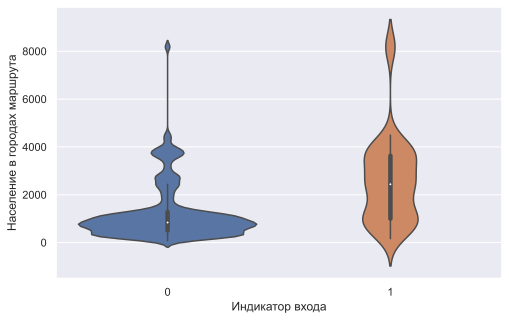

In [21]:
fig = sns.violinplot(x="entry_2", y="population", data=data)
plt.xlabel('Индикатор входа')
plt.ylabel('Население в городах маршрута')
fig.get_figure().savefig("population.png")

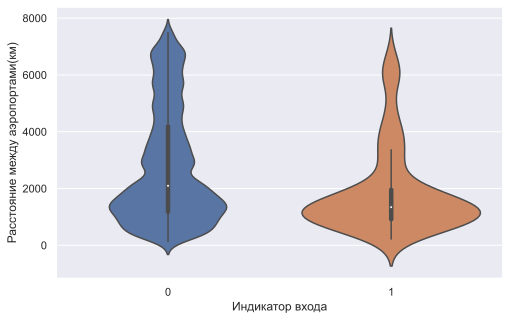

In [11]:
fig = sns.violinplot(x="entry_2", y="distance_km", data=data)
plt.xlabel('Индикатор входа')
plt.ylabel('Расстояние между аэропортами(км)')
fig.get_figure().savefig("distance.png")

In [12]:
data[data['entry_2'] == 1]['distance_km'].mean()

1882.2827835502849

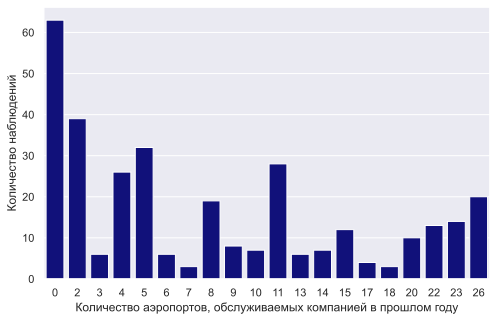

In [13]:
fig = sns.countplot(x="served_airports_pr_period", data=data[data['entry_2'] == 1], color = 'darkblue')
plt.xlabel('Количество аэропортов, обслуживаемых компанией в прошлом году')
plt.ylabel('Количество наблюдений')
fig.get_figure().savefig("served_airports_pr_period_1.png")


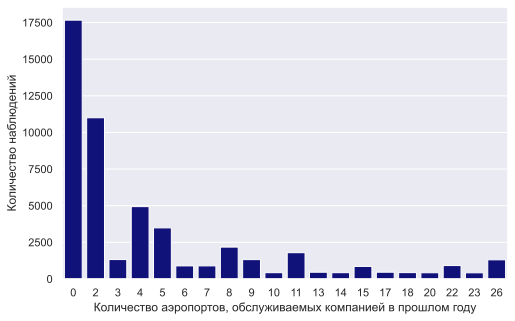

In [14]:
fig = sns.countplot(x="served_airports_pr_period", data=data[data['entry_2'] == 0], color = 'darkblue')
plt.xlabel('Количество аэропортов, обслуживаемых компанией в прошлом году')
plt.ylabel('Количество наблюдений')
fig.get_figure().savefig("served_airports_pr_period_0.png")

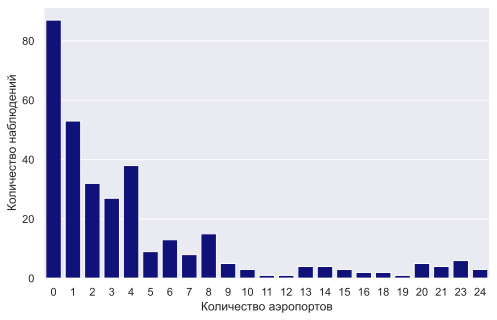

In [15]:
fig = sns.countplot(x="neigh_airports_pr_period", data=data[data['entry_2'] == 1], color = 'darkblue')
plt.xlabel('Количество аэропортов')
plt.ylabel('Количество наблюдений')
fig.get_figure().savefig("neigh_airports_pr_period_1.png")

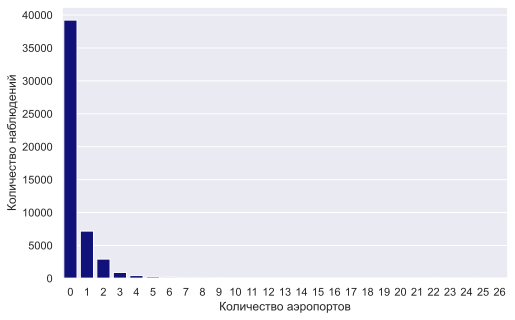

In [16]:
fig = sns.countplot(x="neigh_airports_pr_period", data=data[data['entry_2'] == 0], color = 'darkblue')
plt.xlabel('Количество аэропортов')
plt.ylabel('Количество наблюдений')
fig.get_figure().savefig("neigh_airports_pr_period_0.png")

In [20]:
plt.scatter(
    tsne_repr[:, 0],
    tsne_repr[:, 1],
    c=data["entry"].map({0: "blue", 1: "orange"}),
    alpha=0.5,
);
plt.savefig('t_sne.png')